In [1]:
cd ..

/Users/igor.velikorechanin/Desktop/Masters/Thesis/GitHub PINN 4/trapezoidal_LF_model


/Users/igor.velikorechanin/Library/Python/3.9/lib/python/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import torch
import numpy as np
import random
import time
import os
import matplotlib.pyplot as plt

from utils.plot_utils import plot_final_comparison
from utils.benchmark_utils import run_multiple_tests
from utils.config import PDE_CONFIGS

## Comparison Benchmark (60 seconds)

### Heat Equation


TESTING: Heat Equation (5 runs)
Configuration: n_steps=4
Epochs: LF-PINN=140, Classical=70000


Run 1/5 (seed=42):
  Modified_LF_PINN (140 epochs, lr=0.005)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: heat | Max Steps: 4 | Params: 13
Iterations: 2 | LR: 0.005
Initial theta: 0.4

   Epoch    0: Loss=6.18e-03, PDE=6.18e-03, θ=0.388±0.002
   Epoch   14: Loss=3.11e-03, PDE=3.11e-03, θ=0.388±0.002
   Epoch   28: Loss=6.03e-03, PDE=6.03e-03, θ=0.387±0.002
   Epoch   42: Loss=2.68e-03, PDE=2.68e-03, θ=0.384±0.002
   Epoch   56: Loss=3.63e-03, PDE=3.63e-03, θ=0.389±0.002
   Epoch   70: Loss=4.34e-03, PDE=4.34e-03, θ=0.376±0.002
   Epoch   84: Loss=4.17e-03, PDE=4.17e-03, θ=0.385±0.002
   Epoch   98: Loss=3.83e-03, PDE=3.83e-03, θ=0.384±0.003
   Epoch  112: Loss=4.40e-03, PDE=4.40e-03, θ=0.377±0.004
   Epoch  126: Loss=3.47e-03, PDE=3.47e-03, θ=0.377±0.006
✓ L2RE=1.6453e-02, Params=13
  Ordinary_PINN_15P (70000 epochs, lr=0.001)...    Epoch    0: Loss=8.78e-01, PDE=2.16e-03, Clas

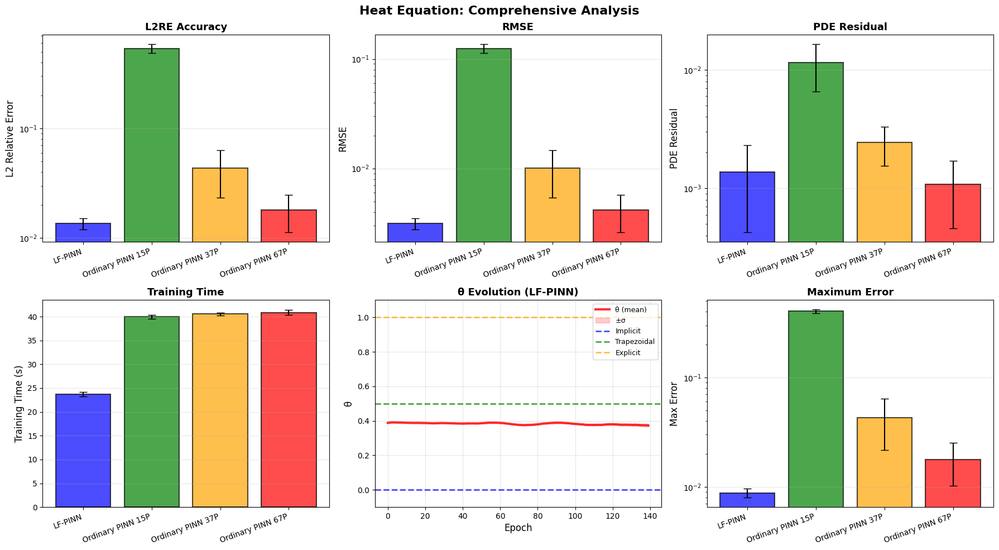

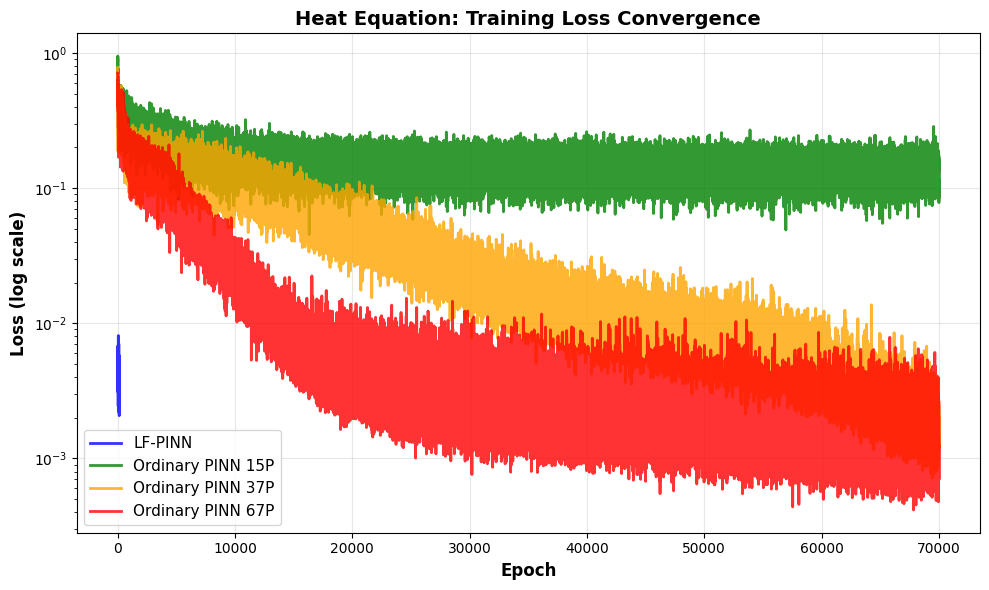

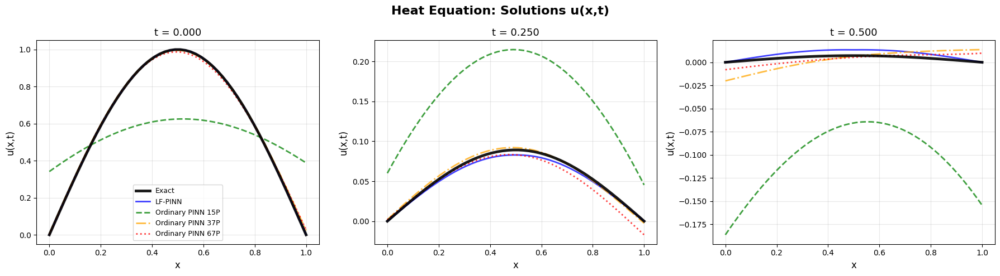

In [3]:
results = run_multiple_tests(
    pde_type='heat', 
    n_runs=5, 
    lf_epochs=140,
    classical_epochs = 70000
)

### Wave Equation


TESTING: Wave Equation (5 runs)
Configuration: n_steps=3
Epochs: LF-PINN=130, Classical=70000


Run 1/5 (seed=42):
  Modified_LF_PINN (130 epochs, lr=0.001)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: wave | Max Steps: 3 | Params: 13
Iterations: 3 | LR: 0.001
Initial theta: 0.5

   Epoch    0: Loss=1.77e+00, PDE=1.77e+00, θ=0.490±0.002
   Epoch   13: Loss=9.54e-01, PDE=9.54e-01, θ=0.482±0.002
   Epoch   26: Loss=9.81e-01, PDE=9.81e-01, θ=0.474±0.003
   Epoch   39: Loss=5.11e-01, PDE=5.11e-01, θ=0.467±0.003
   Epoch   52: Loss=5.24e-01, PDE=5.24e-01, θ=0.459±0.003
   Epoch   65: Loss=3.78e-01, PDE=3.78e-01, θ=0.451±0.003
   Epoch   78: Loss=3.24e-01, PDE=3.24e-01, θ=0.442±0.004
   Epoch   91: Loss=1.94e-01, PDE=1.94e-01, θ=0.432±0.004
   Epoch  104: Loss=9.61e-02, PDE=9.61e-02, θ=0.426±0.005
   Epoch  117: Loss=4.81e-02, PDE=4.81e-02, θ=0.416±0.005
✓ L2RE=3.0143e-02, Params=13
  Ordinary_PINN_15P (70000 epochs, lr=0.001)...    Epoch    0: Loss=8.93e-01, PDE=1.80e-04, Clas

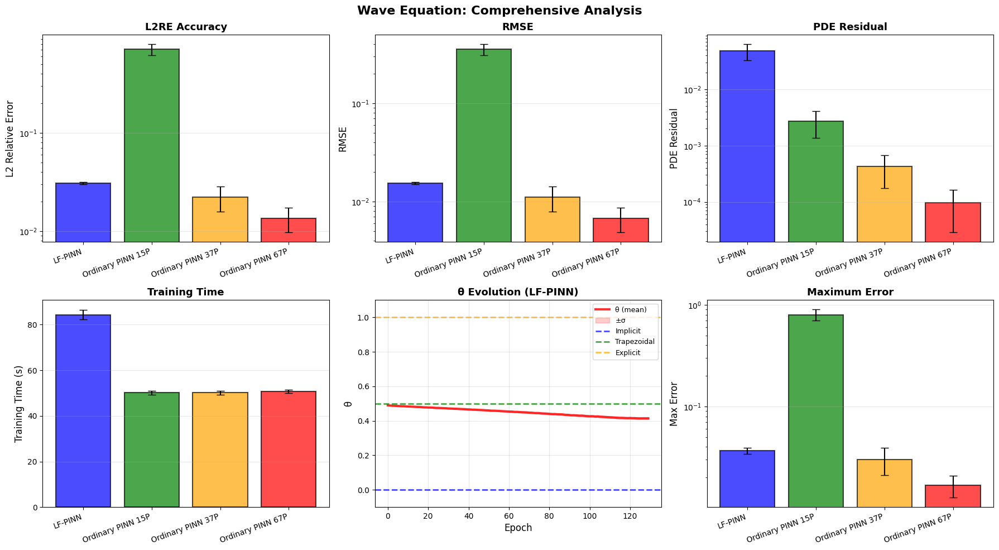

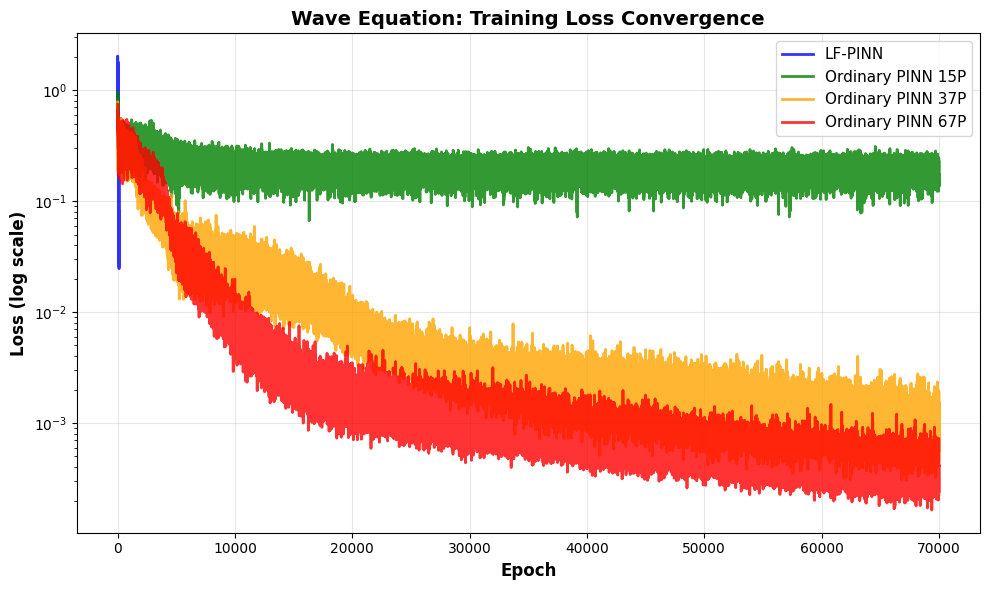

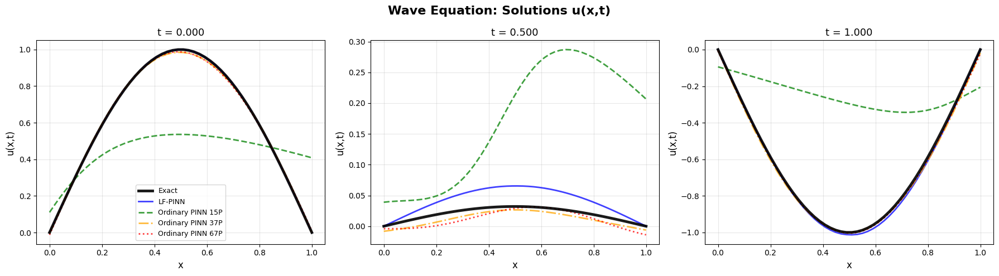

In [4]:
results = run_multiple_tests(
    pde_type='wave', 
    n_runs=5, 
    lf_epochs=130,
    classical_epochs = 70000
)

### Burgers Equation


TESTING: Burgers Equation (5 runs)
Configuration: n_steps=2
Epochs: LF-PINN=200, Classical=70000


Run 1/5 (seed=42):
  Modified_LF_PINN (200 epochs, lr=0.0005)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: burgers | Max Steps: 2 | Params: 13
Iterations: 2 | LR: 0.0005
Initial theta: 0.2

   Epoch    0: Loss=2.69e+00, PDE=2.69e+00, θ=0.196±0.002
   Epoch   20: Loss=3.05e+00, PDE=3.05e+00, θ=0.193±0.002
   Epoch   40: Loss=1.78e+00, PDE=1.78e+00, θ=0.192±0.003
   Epoch   60: Loss=5.21e-01, PDE=5.21e-01, θ=0.192±0.002
   Epoch   80: Loss=8.23e-01, PDE=8.23e-01, θ=0.191±0.003
   Epoch  100: Loss=6.54e-01, PDE=6.54e-01, θ=0.190±0.003
   Epoch  120: Loss=2.08e+00, PDE=2.08e+00, θ=0.190±0.003
   Epoch  140: Loss=1.21e-01, PDE=1.21e-01, θ=0.189±0.003
   Epoch  160: Loss=2.91e+00, PDE=2.91e+00, θ=0.188±0.003
   Epoch  180: Loss=5.33e+00, PDE=5.33e+00, θ=0.187±0.003


/Users/igor.velikorechanin/Desktop/Masters/Thesis/GitHub PINN 4/trapezoidal_LF_model/utils/pde_utils.py:448: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  phi_x, _ = quad(integrand_phi_x, limit_low, limit_high,


✓ L2RE=1.6589e-01, Params=13
  Ordinary_PINN_15P (70000 epochs, lr=0.001)...    Epoch    0: Loss=1.12e+00, PDE=2.46e-05, Classical PINN
   Epoch 7000: Loss=1.83e-01, PDE=3.97e-02, Classical PINN
   Epoch 14000: Loss=1.78e-01, PDE=7.79e-02, Classical PINN
   Epoch 21000: Loss=2.49e-01, PDE=9.13e-02, Classical PINN
   Epoch 28000: Loss=1.58e-01, PDE=4.65e-02, Classical PINN
   Epoch 35000: Loss=1.57e-01, PDE=4.17e-02, Classical PINN
   Epoch 42000: Loss=9.80e-02, PDE=1.21e-02, Classical PINN
   Epoch 49000: Loss=1.84e-01, PDE=4.96e-02, Classical PINN
   Epoch 56000: Loss=2.00e-01, PDE=4.48e-02, Classical PINN
   Epoch 63000: Loss=1.53e-01, PDE=1.64e-02, Classical PINN
✓ L2RE=4.7682e-01, Params=15
  Ordinary_PINN_37P (70000 epochs, lr=0.001)...    Epoch    0: Loss=5.73e-01, PDE=3.35e-04, Classical PINN
   Epoch 7000: Loss=1.69e-01, PDE=4.20e-02, Classical PINN
   Epoch 14000: Loss=1.13e-01, PDE=3.00e-02, Classical PINN
   Epoch 21000: Loss=7.90e-02, PDE=2.19e-02, Classical PINN
   Epoch 2

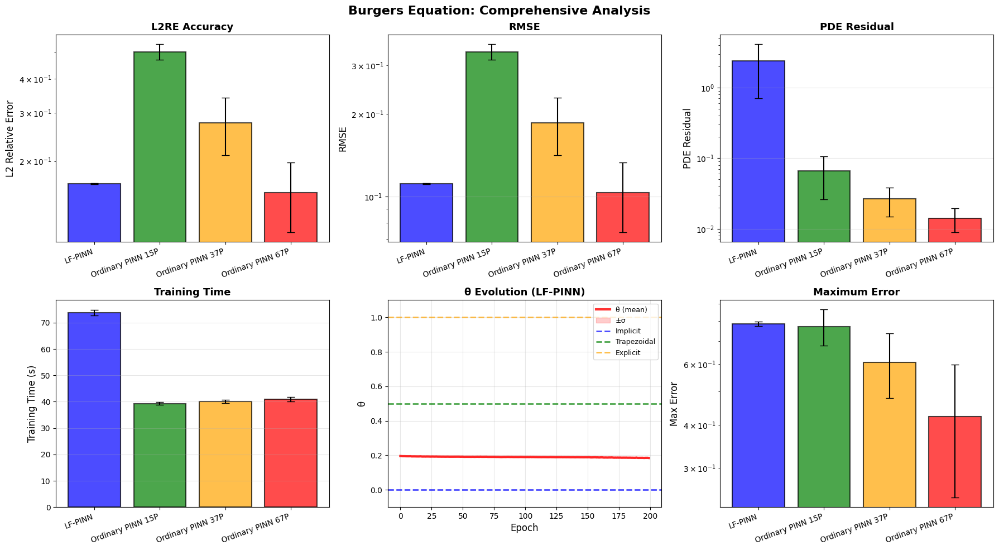

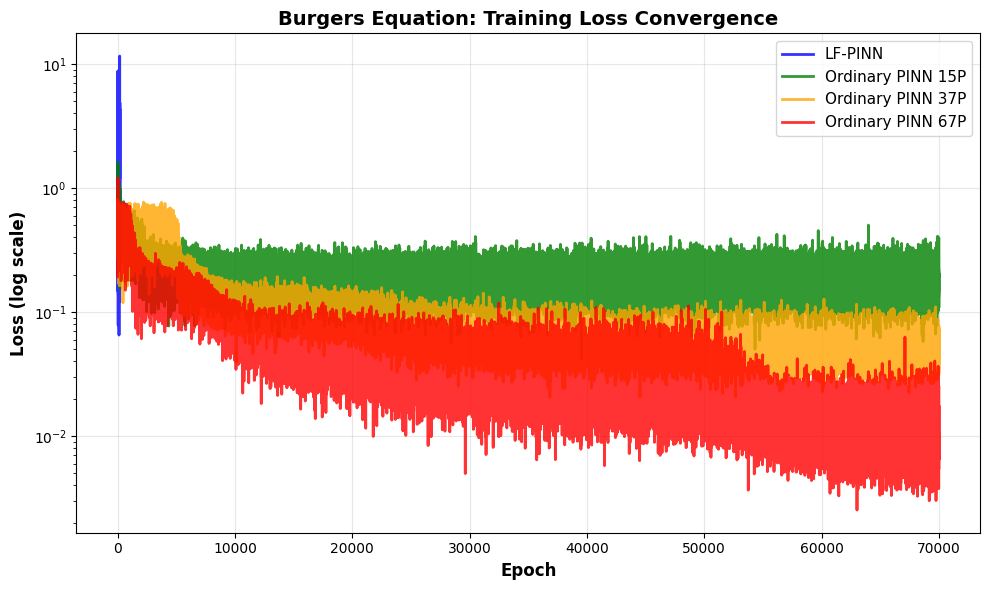

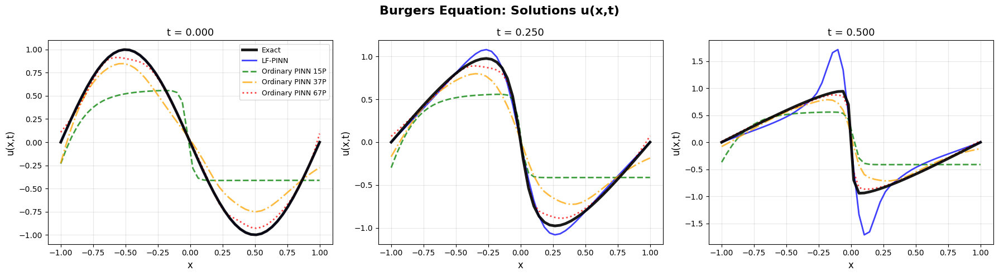

In [5]:
results = run_multiple_tests(
    pde_type='burgers', 
    n_runs=5, 
    lf_epochs=200,
    classical_epochs = 70000
)

### Reaction-Diffusion Equation


TESTING: Reaction-Diffusion (5 runs)
Configuration: n_steps=2
Epochs: LF-PINN=200, Classical=70000


Run 1/5 (seed=42):
  Modified_LF_PINN (200 epochs, lr=0.005)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: reaction_diffusion | Max Steps: 2 | Params: 13
Iterations: 2 | LR: 0.005
Initial theta: 0.3

   Epoch    0: Loss=1.44e-02, PDE=1.44e-02, θ=0.293±0.004
   Epoch   20: Loss=2.62e-03, PDE=2.62e-03, θ=0.264±0.005
   Epoch   40: Loss=3.79e-03, PDE=3.79e-03, θ=0.240±0.007
   Epoch   60: Loss=2.74e-03, PDE=2.74e-03, θ=0.216±0.007
   Epoch   80: Loss=1.32e-04, PDE=1.32e-04, θ=0.194±0.007
   Epoch  100: Loss=1.91e-04, PDE=1.91e-04, θ=0.180±0.006
   Epoch  120: Loss=2.25e-04, PDE=2.25e-04, θ=0.173±0.008
   Epoch  140: Loss=1.76e-05, PDE=1.76e-05, θ=0.165±0.006
   Epoch  160: Loss=1.13e-03, PDE=1.13e-03, θ=0.162±0.008
   Epoch  180: Loss=6.06e-04, PDE=6.06e-04, θ=0.157±0.007
✓ L2RE=1.3583e-01, Params=13
  Ordinary_PINN_15P (70000 epochs, lr=0.001)...    Epoch    0: Loss=9.50e-01,

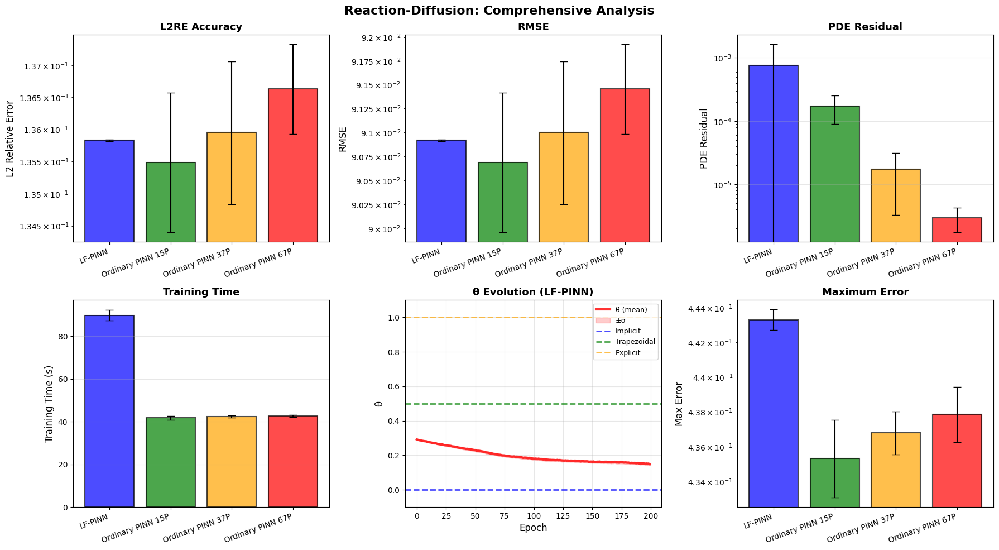

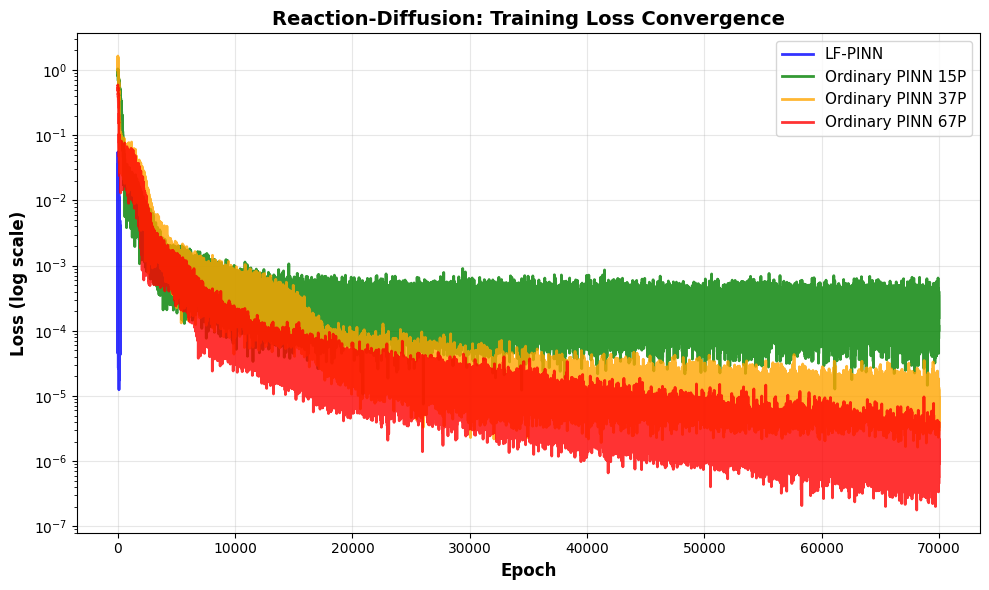

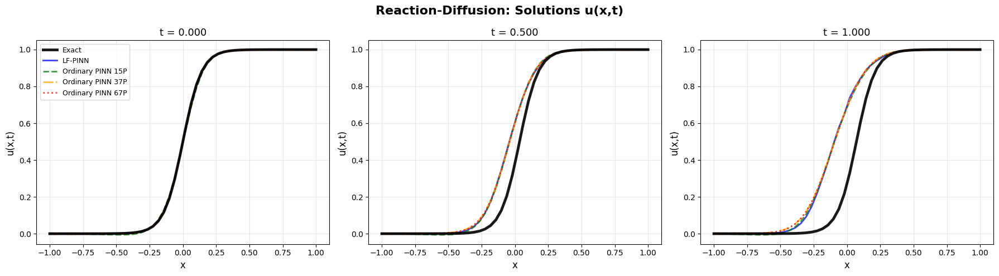

In [6]:
results = run_multiple_tests(
    pde_type='reaction_diffusion', 
    n_runs=5, 
    lf_epochs=200,
    classical_epochs = 70000
)

## Comparison Benchmark (L2RE = 0.1)

### Heat Equation


TESTING: Heat Equation (5 runs)
Configuration: n_steps=4
Epochs: LF-PINN=100000, Classical=100000


Run 1/5 (seed=42):
  Modified_LF_PINN (100000 epochs, lr=0.005)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: heat | Max Steps: 4 | Params: 13
Iterations: 2 | LR: 0.005
Initial theta: 0.4

   Epoch    0: Loss=6.18e-03, PDE=6.18e-03, θ=0.388±0.002
   Eval at epoch 5: L2RE=1.87e-02
   Converged by l2re < 0.1 at epoch 5 with value 1.87e-02. Time: 0.81s
✓ L2RE=1.8664e-02, Params=13
  Ordinary_PINN_15P (100000 epochs, lr=0.001)...    Epoch    0: Loss=8.78e-01, PDE=2.16e-03, Classical PINN
   Eval at epoch 5: L2RE=2.32e+00
   Eval at epoch 10: L2RE=2.27e+00
   Eval at epoch 15: L2RE=2.21e+00
   Eval at epoch 20: L2RE=2.16e+00
   Eval at epoch 25: L2RE=2.11e+00
   Eval at epoch 30: L2RE=2.05e+00
   Eval at epoch 35: L2RE=2.00e+00
   Eval at epoch 40: L2RE=1.95e+00
   Eval at epoch 45: L2RE=1.90e+00
   Eval at epoch 50: L2RE=1.85e+00
   Eval at epoch 55: L2RE=1.79e+00
   Eval at epo

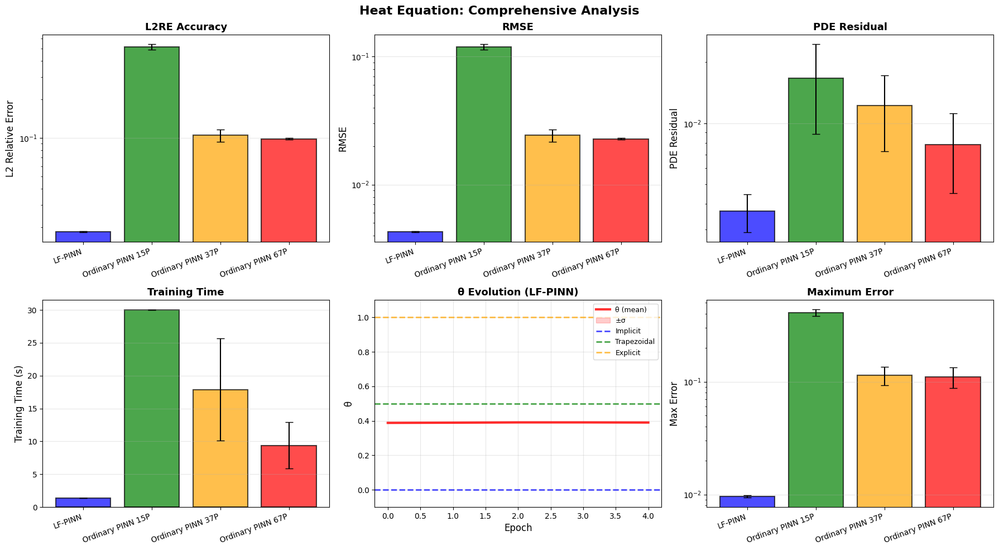

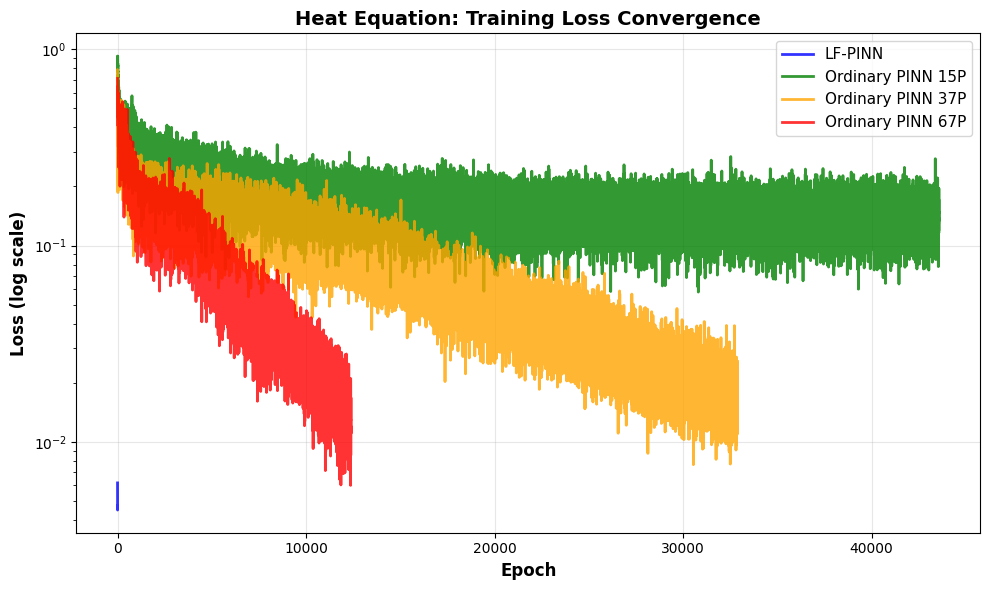

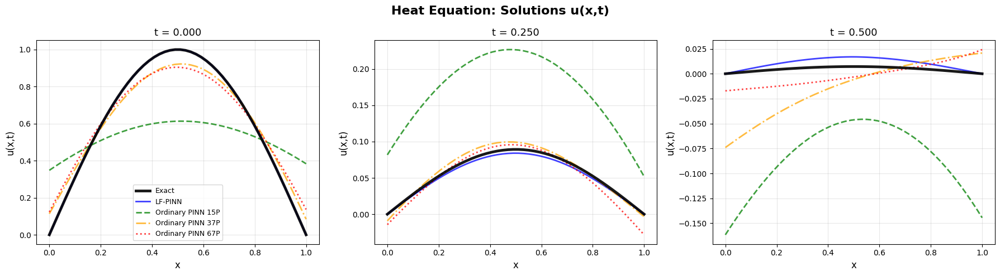

In [7]:
results = run_multiple_tests(
    pde_type='heat', 
    n_runs=5, 
    max_time=30,
    lf_epochs=100000,
    classical_epochs=100000,
    target_metric='l2re', 
    target_value=0.1
)

### Wave Equation


TESTING: Wave Equation (5 runs)
Configuration: n_steps=3
Epochs: LF-PINN=100000, Classical=100000


Run 1/5 (seed=42):
  Modified_LF_PINN (100000 epochs, lr=0.001)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: wave | Max Steps: 3 | Params: 13
Iterations: 3 | LR: 0.001
Initial theta: 0.5

   Epoch    0: Loss=1.77e+00, PDE=1.77e+00, θ=0.490±0.002
   Eval at epoch 5: L2RE=1.39e-01
   Eval at epoch 10: L2RE=1.34e-01
   Eval at epoch 15: L2RE=1.29e-01
   Eval at epoch 20: L2RE=1.24e-01
   Eval at epoch 25: L2RE=1.19e-01
   Eval at epoch 30: L2RE=1.13e-01
   Training stopped after 32 epochs due to time limit (30s). Elapsed: 30.09s
✓ L2RE=1.1132e-01, Params=13
  Ordinary_PINN_15P (100000 epochs, lr=0.001)...    Epoch    0: Loss=8.93e-01, PDE=1.80e-04, Classical PINN
   Eval at epoch 5: L2RE=1.63e+00
   Eval at epoch 10: L2RE=1.60e+00
   Eval at epoch 15: L2RE=1.58e+00
   Eval at epoch 20: L2RE=1.56e+00
   Eval at epoch 25: L2RE=1.54e+00
   Eval at epoch 30: L2RE=1.52e+00
   Eval 

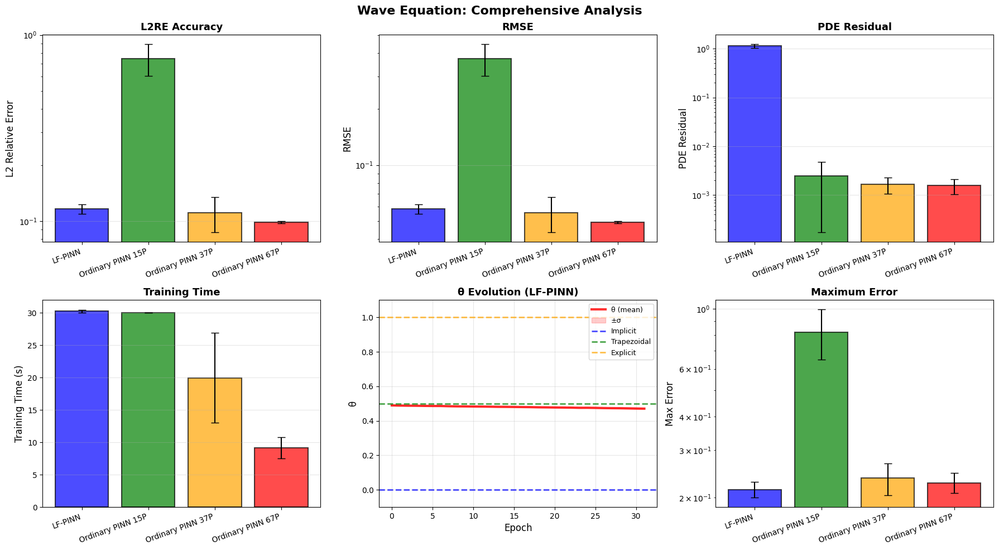

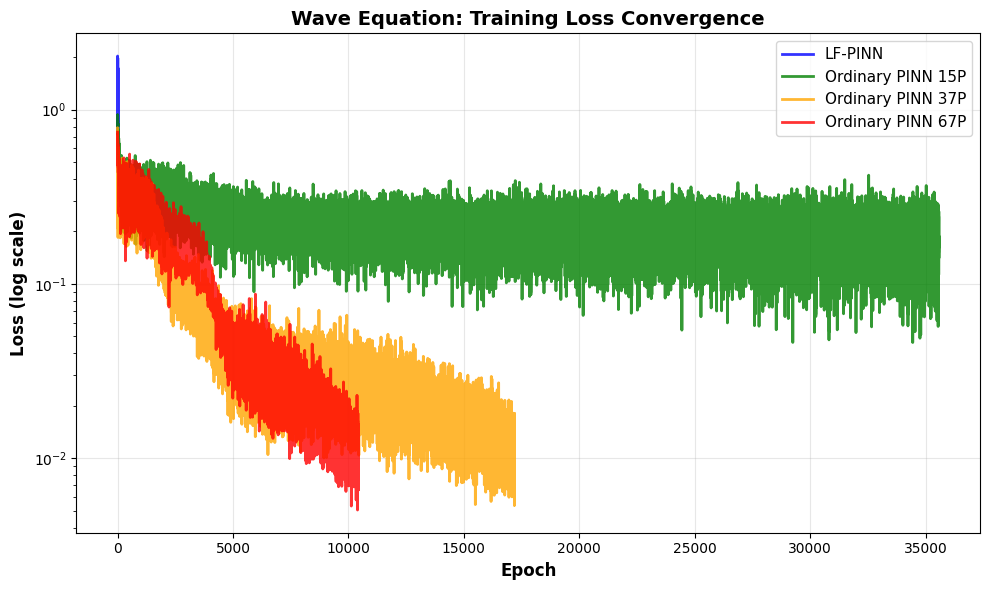

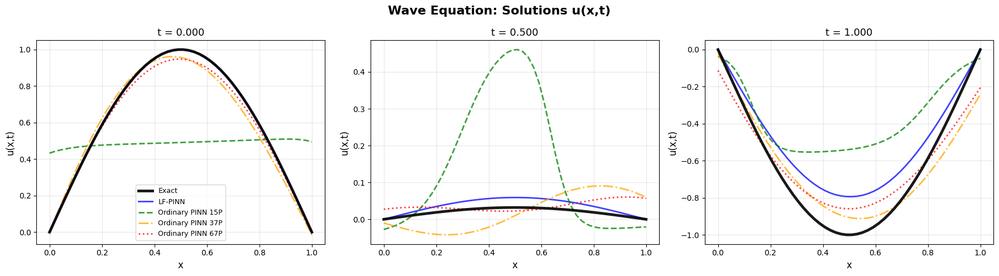

In [8]:
results = run_multiple_tests(
    pde_type='wave', 
    n_runs=5,
    lf_epochs=100000,
    classical_epochs=100000,
    max_time=30,
    target_metric='l2re', 
    target_value=0.1
)

### Burgers Equation


TESTING: Burgers Equation (5 runs)
Configuration: n_steps=2
Epochs: LF-PINN=100000, Classical=100000


Run 1/5 (seed=42):
  Modified_LF_PINN (100000 epochs, lr=0.0005)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: burgers | Max Steps: 2 | Params: 13
Iterations: 2 | LR: 0.0005
Initial theta: 0.2

   Epoch    0: Loss=2.69e+00, PDE=2.69e+00, θ=0.196±0.002


/Users/igor.velikorechanin/Desktop/Masters/Thesis/GitHub PINN 4/trapezoidal_LF_model/utils/pde_utils.py:448: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  phi_x, _ = quad(integrand_phi_x, limit_low, limit_high,


   Eval at epoch 5: L2RE=1.64e-01
   Eval at epoch 10: L2RE=1.64e-01
   Eval at epoch 15: L2RE=1.64e-01
   Eval at epoch 20: L2RE=1.64e-01
   Eval at epoch 25: L2RE=1.64e-01
   Eval at epoch 30: L2RE=1.64e-01
   Eval at epoch 35: L2RE=1.64e-01
   Training stopped after 36 epochs due to time limit (30s). Elapsed: 30.84s
✓ L2RE=1.6436e-01, Params=13
  Ordinary_PINN_15P (100000 epochs, lr=0.001)...    Epoch    0: Loss=1.12e+00, PDE=2.46e-05, Classical PINN
   Eval at epoch 5: L2RE=1.38e+00
   Eval at epoch 10: L2RE=1.37e+00
   Eval at epoch 15: L2RE=1.35e+00
   Eval at epoch 20: L2RE=1.34e+00
   Eval at epoch 25: L2RE=1.33e+00
   Eval at epoch 30: L2RE=1.32e+00
   Eval at epoch 35: L2RE=1.31e+00
   Eval at epoch 40: L2RE=1.30e+00
   Eval at epoch 45: L2RE=1.29e+00
   Eval at epoch 50: L2RE=1.28e+00
   Eval at epoch 55: L2RE=1.27e+00
   Eval at epoch 60: L2RE=1.25e+00
   Eval at epoch 65: L2RE=1.24e+00
   Eval at epoch 70: L2RE=1.23e+00
   Eval at epoch 75: L2RE=1.23e+00
   Eval at epoch 8

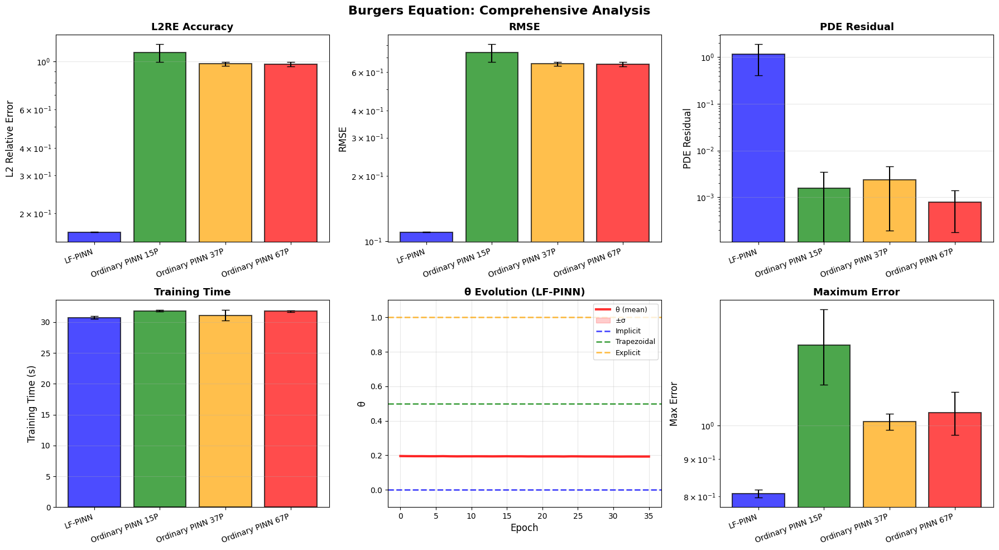

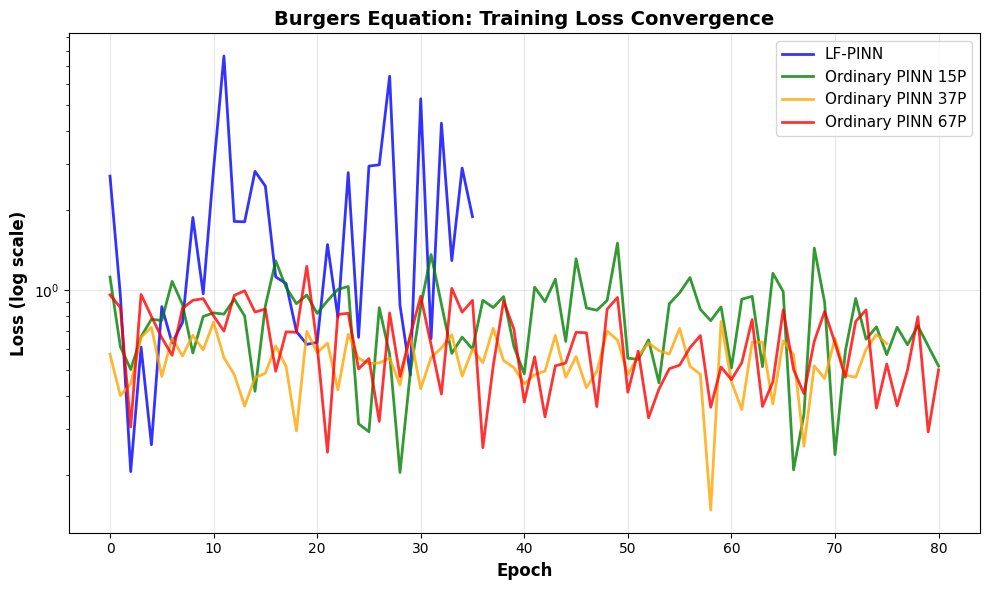

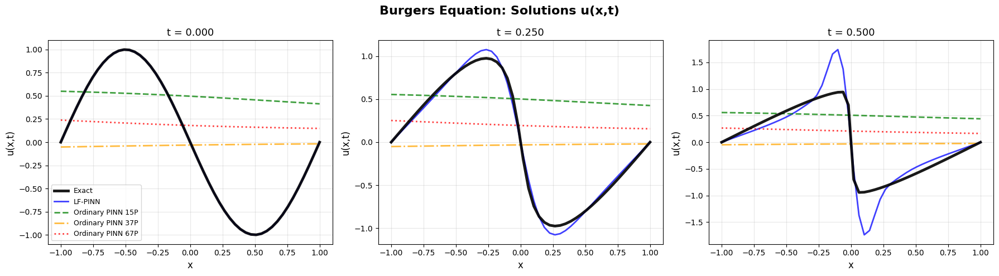

In [9]:
results = run_multiple_tests(
    pde_type='burgers', 
    n_runs=5,
    max_time=30,
    lf_epochs=100000,
    classical_epochs=100000,
    target_metric='l2re', 
    target_value=0.1
)

### Reaction-diffusion Equation


TESTING: Reaction-Diffusion (5 runs)
Configuration: n_steps=2
Epochs: LF-PINN=100000, Classical=100000


Run 1/5 (seed=42):
  Modified_LF_PINN (100000 epochs, lr=0.005)... 
Low-Fidelity PINN (Fixed-Point + Adaptive Steps)
PDE: reaction_diffusion | Max Steps: 2 | Params: 13
Iterations: 2 | LR: 0.005
Initial theta: 0.3

   Epoch    0: Loss=1.44e-02, PDE=1.44e-02, θ=0.293±0.004
   Eval at epoch 5: L2RE=1.36e-01
   Eval at epoch 10: L2RE=1.36e-01
   Eval at epoch 15: L2RE=1.36e-01
   Eval at epoch 20: L2RE=1.36e-01
   Eval at epoch 25: L2RE=1.36e-01
   Eval at epoch 30: L2RE=1.36e-01
   Eval at epoch 35: L2RE=1.36e-01
   Eval at epoch 40: L2RE=1.36e-01
   Eval at epoch 45: L2RE=1.36e-01
   Eval at epoch 50: L2RE=1.36e-01
   Training stopped after 53 epochs due to time limit (30s). Elapsed: 30.26s
✓ L2RE=1.3583e-01, Params=13
  Ordinary_PINN_15P (100000 epochs, lr=0.001)...    Epoch    0: Loss=9.50e-01, PDE=4.13e-02, Classical PINN
   Eval at epoch 5: L2RE=7.64e-01
   Eval at epoch 10: L2R

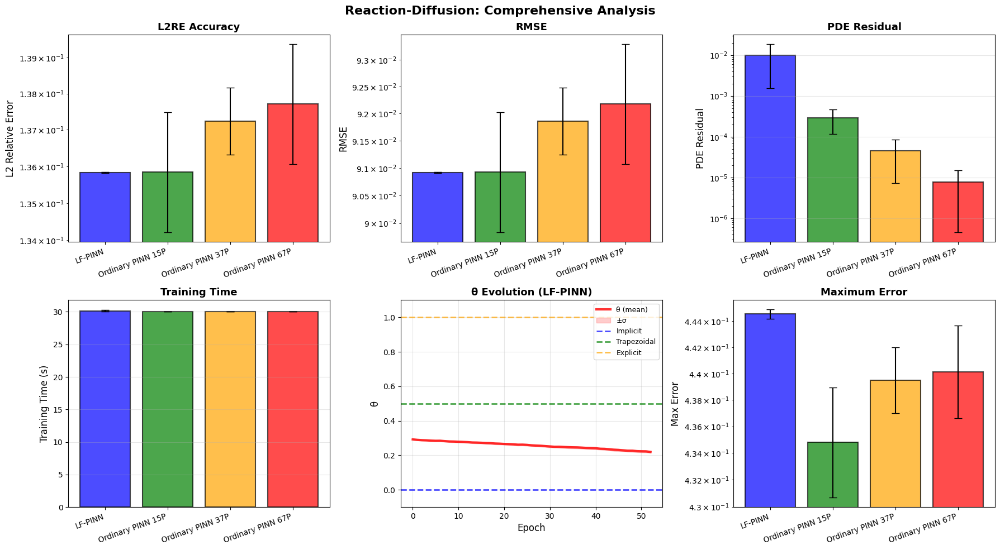

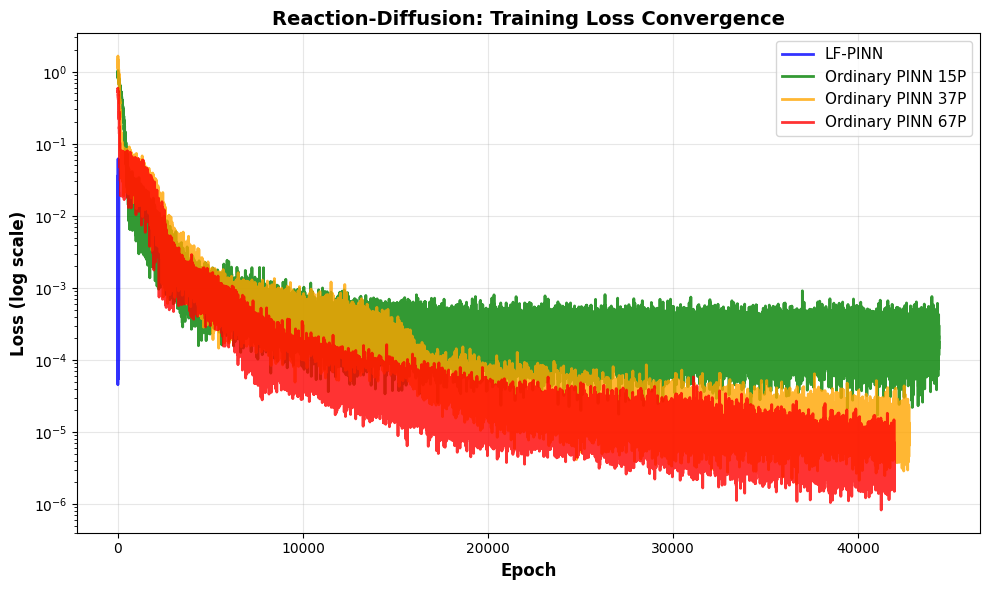

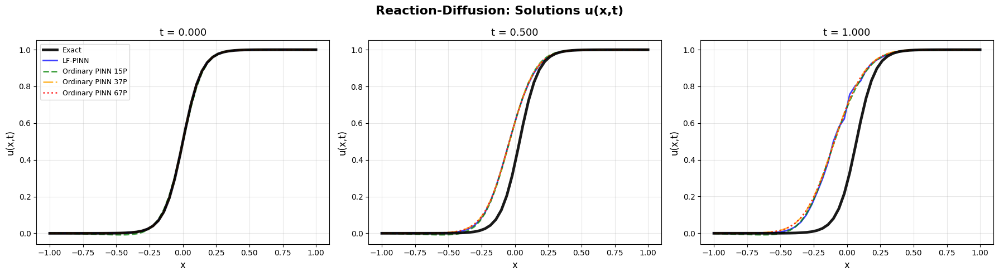

In [10]:
results = run_multiple_tests(
    pde_type='reaction_diffusion', 
    n_runs=5,
    max_time=30,
    lf_epochs=100000,
    classical_epochs=100000,
    target_metric='l2re', 
    target_value=0.1
)